In [1]:
import pandas as pd
import numpy as np

In [2]:
#data = pd.read_csv('JoseRamirez-Batted-Ball-Data.txt',sep='\t',lineterminator='\n')
data = pd.read_csv('data/2021_batted_ball_data.csv')
data.shape

(123150, 40)

In [3]:
data.head()

,Unnamed: 0,pitch_type,game_date,player_name,batter,pitcher,events,description,stand,p_throws,...,estimated_ba_using_speedangle,estimated_woba_using_speedangle,launch_speed_angle,at_bat_number,pitch_number,pitch_name,bat_score,fld_score,if_fielding_alignment,of_fielding_alignment
0,26,FF,2021-11-02,"Gurriel, Yuli",493329,519293,field_out,hit_into_play,R,L,...,0.071,0.064,2.0,69,3,4-Seam Fastball,0,7,Standard,Standard
1,30,FF,2021-11-02,"Alvarez, Yordan",670541,519293,field_out,hit_into_play,L,L,...,0.026,0.046,3.0,68,6,4-Seam Fastball,0,7,Infield shift,Standard
2,28,FF,2021-11-02,"Correa, Carlos",621043,519293,field_out,hit_into_play,R,L,...,0.149,0.182,3.0,67,4,4-Seam Fastball,0,7,Infield shift,Standard
3,8,FF,2021-11-02,"Brantley, Michael",488726,519293,single,hit_into_play,L,L,...,0.871,0.855,4.0,66,6,4-Seam Fastball,0,7,Infield shift,Standard
4,62,CH,2021-11-02,"Rosario, Eddie",592696,554340,field_out,hit_into_play,L,R,...,0.069,0.063,2.0,65,2,Changeup,7,0,Infield shift,Standard


In [4]:
data.drop('Unnamed: 0', axis=1, inplace=True)
data.index.names = ['row_id']
data.head()

,pitch_type,game_date,player_name,batter,pitcher,events,description,stand,p_throws,home_team,...,estimated_ba_using_speedangle,estimated_woba_using_speedangle,launch_speed_angle,at_bat_number,pitch_number,pitch_name,bat_score,fld_score,if_fielding_alignment,of_fielding_alignment
row_id,,,,,,,,,,,,,,,,,,,,,
0,FF,2021-11-02,"Gurriel, Yuli",493329,519293,field_out,hit_into_play,R,L,HOU,...,0.071,0.064,2.0,69,3,4-Seam Fastball,0,7,Standard,Standard
1,FF,2021-11-02,"Alvarez, Yordan",670541,519293,field_out,hit_into_play,L,L,HOU,...,0.026,0.046,3.0,68,6,4-Seam Fastball,0,7,Infield shift,Standard
2,FF,2021-11-02,"Correa, Carlos",621043,519293,field_out,hit_into_play,R,L,HOU,...,0.149,0.182,3.0,67,4,4-Seam Fastball,0,7,Infield shift,Standard
3,FF,2021-11-02,"Brantley, Michael",488726,519293,single,hit_into_play,L,L,HOU,...,0.871,0.855,4.0,66,6,4-Seam Fastball,0,7,Infield shift,Standard
4,CH,2021-11-02,"Rosario, Eddie",592696,554340,field_out,hit_into_play,L,R,HOU,...,0.069,0.063,2.0,65,2,Changeup,7,0,Infield shift,Standard


In [5]:
data.columns

Index(['pitch_type', 'game_date', 'player_name', 'batter', 'pitcher', 'events',
       'description', 'stand', 'p_throws', 'home_team', 'away_team', 'type',
       'hit_location', 'bb_type', 'balls', 'strikes', 'game_year', 'on_3b',
       'on_2b', 'on_1b', 'outs_when_up', 'inning', 'inning_topbot', 'hc_x',
       'hc_y', 'hit_distance_sc', 'launch_speed', 'launch_angle', 'game_pk',
       'estimated_ba_using_speedangle', 'estimated_woba_using_speedangle',
       'launch_speed_angle', 'at_bat_number', 'pitch_number', 'pitch_name',
       'bat_score', 'fld_score', 'if_fielding_alignment',
       'of_fielding_alignment'],
      dtype='object')

In [6]:
dt = data[['game_pk','game_date','home_team','away_team','player_name'
           ,'inning', 'inning_topbot', 'outs_when_up'
           ,'on_3b', 'on_2b', 'on_1b'
           ,'if_fielding_alignment', 'of_fielding_alignment'
           ,'launch_speed','launch_angle','hc_x','hc_y'
           ,'bb_type', 'events']].copy()
dt.head()

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,on_1b,if_fielding_alignment,of_fielding_alignment,launch_speed,launch_angle,hc_x,hc_y,bb_type,events
row_id,,,,,,,,,,,,,,,,,,,
0,660906,2021-11-02,HOU,ATL,"Gurriel, Yuli",9,Bot,2,NaN,NaN,488726.0,Standard,Standard,93.8,-28.0,98.12,136.43,ground_ball,field_out
1,660906,2021-11-02,HOU,ATL,"Alvarez, Yordan",9,Bot,1,NaN,NaN,488726.0,Infield shift,Standard,92.7,39.0,68.50,86.79,fly_ball,field_out
2,660906,2021-11-02,HOU,ATL,"Correa, Carlos",9,Bot,0,NaN,NaN,488726.0,Infield shift,Standard,93.1,24.0,173.40,72.81,line_drive,field_out
3,660906,2021-11-02,HOU,ATL,"Brantley, Michael",9,Bot,0,NaN,NaN,NaN,Infield shift,Standard,103.4,13.0,175.56,102.42,line_drive,single
4,660906,2021-11-02,HOU,ATL,"Rosario, Eddie",9,Top,2,NaN,NaN,NaN,Infield shift,Standard,78.5,-13.0,159.51,167.83,ground_ball,field_out


In [7]:
import math

dt['adj_hc_x'] = (dt['hc_x'] - 125.42).astype('float')
dt['adj_hc_y'] = (198.27 - dt['hc_y']).astype('float')

dt['spray_angle'] = dt.apply(lambda x:
                             float('NaN') if (math.isnan(x['adj_hc_x']) | math.isnan(x['adj_hc_y']))
                             else math.atan2(x['adj_hc_x'], x['adj_hc_y']), axis=1)*180/math.pi*0.75

dt['fielding_team'] = np.where(dt['inning_topbot'] == 'Top', dt['home_team'], dt['away_team'])
dt['batter_at_home'] = np.where(dt['inning_topbot'] == 'Bot', 1.0, 0.0)

dt.head(150)

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,...,launch_angle,hc_x,hc_y,bb_type,events,adj_hc_x,adj_hc_y,spray_angle,fielding_team,batter_at_home
row_id,,,,,,,,,,,,,,,,,,,,,
0,660906,2021-11-02,HOU,ATL,"Gurriel, Yuli",9,Bot,2,NaN,NaN,...,-28.0,98.12,136.43,ground_ball,field_out,-27.30,61.84,-17.864721,ATL,1.0
1,660906,2021-11-02,HOU,ATL,"Alvarez, Yordan",9,Bot,1,NaN,NaN,...,39.0,68.50,86.79,fly_ball,field_out,-56.92,111.48,-20.286126,ATL,1.0
2,660906,2021-11-02,HOU,ATL,"Correa, Carlos",9,Bot,0,NaN,NaN,...,24.0,173.40,72.81,line_drive,field_out,47.98,125.46,15.696365,ATL,1.0
3,660906,2021-11-02,HOU,ATL,"Brantley, Michael",9,Bot,0,NaN,NaN,...,13.0,175.56,102.42,line_drive,single,50.14,95.85,20.710854,ATL,1.0
4,660906,2021-11-02,HOU,ATL,"Rosario, Eddie",9,Top,2,NaN,NaN,...,-13.0,159.51,167.83,ground_ball,field_out,34.09,30.44,36.178022,HOU,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,660902,2021-10-30,ATL,HOU,"Greinke, Zack",2,Top,1,NaN,NaN,...,-6.0,122.12,89.53,ground_ball,single,-3.30,108.74,-1.303693,ATL,0.0
146,660902,2021-10-30,ATL,HOU,"Gurriel, Yuli",2,Top,0,NaN,NaN,...,-33.0,144.47,163.70,ground_ball,field_out,19.05,34.57,21.642913,ATL,0.0
147,660902,2021-10-30,ATL,HOU,"Riley, Austin",1,Bot,2,NaN,NaN,...,24.0,144.55,77.76,line_drive,field_out,19.13,120.51,6.764989,HOU,1.0


<AxesSubplot:>

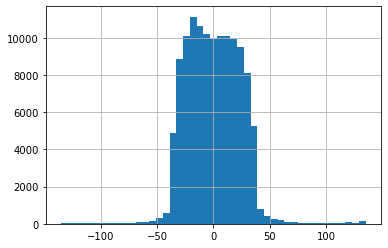

In [8]:
dt['spray_angle'].hist(bins=45)

In [9]:
dt.groupby('events').size()

events
catcher_interf                   3
double                        7949
double_play                    390
field_error                   1254
field_out                    71763
fielders_choice                410
fielders_choice_out            288
force_out                     3750
grounded_into_double_play     3354
home_run                      6026
sac_bunt                       766
sac_bunt_double_play             2
sac_fly                       1138
sac_fly_double_play             17
single                       25360
triple                         675
triple_play                      5
dtype: int64

In [10]:
dt['is_hit'] = dt['events'].map(
    {'catcher_interf': 0.
     ,'double': 1.
     ,'double_play': 0.
     ,'field_error': 0.
     ,'field_out': 0.
     ,'fielders_choice': 0.
     ,'fielders_choice_out': 0.
     ,'force_out': 0.
     ,'grounded_into_double_play': 0.
     ,'home_run': 1.
     ,'sac_bunt': 0.
     ,'sac_bunt_double_play': 0.
     ,'sac_fly': 0.
     ,'sac_fly_double_play': 0.
     ,'single': 1.
     ,'triple': 1.
     ,'triple_play': 0.
    })

dt['is_hit_bool'] = dt['is_hit']==1

In [11]:
dt.head(10)

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,...,hc_y,bb_type,events,adj_hc_x,adj_hc_y,spray_angle,fielding_team,batter_at_home,is_hit,is_hit_bool
row_id,,,,,,,,,,,,,,,,,,,,,
0,660906,2021-11-02,HOU,ATL,"Gurriel, Yuli",9,Bot,2,NaN,NaN,...,136.43,ground_ball,field_out,-27.30,61.84,-17.864721,ATL,1.0,0.0,False
1,660906,2021-11-02,HOU,ATL,"Alvarez, Yordan",9,Bot,1,NaN,NaN,...,86.79,fly_ball,field_out,-56.92,111.48,-20.286126,ATL,1.0,0.0,False
2,660906,2021-11-02,HOU,ATL,"Correa, Carlos",9,Bot,0,NaN,NaN,...,72.81,line_drive,field_out,47.98,125.46,15.696365,ATL,1.0,0.0,False
3,660906,2021-11-02,HOU,ATL,"Brantley, Michael",9,Bot,0,NaN,NaN,...,102.42,line_drive,single,50.14,95.85,20.710854,ATL,1.0,1.0,True
4,660906,2021-11-02,HOU,ATL,"Rosario, Eddie",9,Top,2,NaN,NaN,...,167.83,ground_ball,field_out,34.09,30.44,36.178022,HOU,0.0,0.0,False
5,660906,2021-11-02,HOU,ATL,"Swanson, Dansby",9,Top,1,NaN,NaN,...,137.28,line_drive,field_out,-17.77,60.99,-12.182978,HOU,0.0,0.0,False
6,660906,2021-11-02,HOU,ATL,"d'Arnaud, Travis",9,Top,0,NaN,NaN,...,83.30,fly_ball,field_out,-6.22,114.97,-2.322558,HOU,0.0,0.0,False
7,660906,2021-11-02,HOU,ATL,"Albies, Ozzie",8,Top,2,NaN,NaN,...,68.50,fly_ball,field_out,-14.56,129.77,-4.801296,HOU,0.0,0.0,False
8,660906,2021-11-02,HOU,ATL,"Pederson, Joc",8,Top,1,NaN,NaN,...,170.17,ground_ball,field_out,30.18,28.10,35.283004,HOU,0.0,0.0,False


In [12]:
dt.columns.values.tolist().copy()

['game_pk',
 'game_date',
 'home_team',
 'away_team',
 'player_name',
 'inning',
 'inning_topbot',
 'outs_when_up',
 'on_3b',
 'on_2b',
 'on_1b',
 'if_fielding_alignment',
 'of_fielding_alignment',
 'launch_speed',
 'launch_angle',
 'hc_x',
 'hc_y',
 'bb_type',
 'events',
 'adj_hc_x',
 'adj_hc_y',
 'spray_angle',
 'fielding_team',
 'batter_at_home',
 'is_hit',
 'is_hit_bool']

In [13]:
all_vars = dt.columns.values.tolist().copy()

input_vars = ['launch_speed', 'launch_angle', 'spray_angle', 'home_team', 'batter_at_home']
input_vars_num = ['launch_speed', 'launch_angle', 'spray_angle']
input_vars_bin = ['batter_at_home']
input_vars_ctg = ['home_team']
output_vars = ['is_hit']
output_ctg_vars = ['is_hit_bool']
core_vars = input_vars + output_vars
plot_vars = input_vars_num + output_ctg_vars

print(f'all variables: {all_vars}\n')
print(f'input variables: {input_vars}')
print(f'numerical input variables: {input_vars_num}')
print(f'binary input variables: {input_vars_bin}')
print(f'categorical input variables: {input_vars_ctg}')
print(f'output variables: {output_vars}')
print(f'output category variables: {output_ctg_vars}')
print(f'core variables: {core_vars}')
print(f'plot variables: {plot_vars}')
#output_vars = list(dt.columns[3])
#output_vars

all variables: ['game_pk', 'game_date', 'home_team', 'away_team', 'player_name', 'inning', 'inning_topbot', 'outs_when_up', 'on_3b', 'on_2b', 'on_1b', 'if_fielding_alignment', 'of_fielding_alignment', 'launch_speed', 'launch_angle', 'hc_x', 'hc_y', 'bb_type', 'events', 'adj_hc_x', 'adj_hc_y', 'spray_angle', 'fielding_team', 'batter_at_home', 'is_hit', 'is_hit_bool']

input variables: ['launch_speed', 'launch_angle', 'spray_angle', 'home_team', 'batter_at_home']
numerical input variables: ['launch_speed', 'launch_angle', 'spray_angle']
binary input variables: ['batter_at_home']
categorical input variables: ['home_team']
output variables: ['is_hit']
output category variables: ['is_hit_bool']
core variables: ['launch_speed', 'launch_angle', 'spray_angle', 'home_team', 'batter_at_home', 'is_hit']
plot variables: ['launch_speed', 'launch_angle', 'spray_angle', 'is_hit_bool']


In [14]:
ctg_val_colnames = []
ctg_val_maps = {}

for category in input_vars_ctg:

    ctg_val_maps[category] = {}
    
    ctg_val_maps[category]['orig_name'] = category
    
    #ctg_val_maps['orig_col_name'] = category
    
    ctg_val_colname = category + '_ctg_val'
    ctg_val_maps[category]['ctg_val_name'] = ctg_val_colname
    
    dt[ctg_val_colname] = dt[category].astype('category').cat.codes.values
    
    maps = dict(zip( dt[category], dt[ctg_val_colname] ) )
    ctg_val_maps[category]['num_maps'] = len(maps)
    ctg_val_maps[category]['orig_to_ctg_val_maps'] = maps
    #print(dict(enumerate(dt[category].cat.categories )))
    
    #dt[ctg_val_colname] = dt[category].cat.codes.values
    ctg_val_colnames.append(ctg_val_colname)


In [15]:
ctg_val_maps

{'home_team': {'orig_name': 'home_team',
  'ctg_val_name': 'home_team_ctg_val',
  'num_maps': 30,
  'orig_to_ctg_val_maps': {'HOU': 10,
   'ATL': 1,
   'LAD': 13,
   'BOS': 3,
   'SF': 24,
   'CWS': 8,
   'MIL': 15,
   'TB': 26,
   'ARI': 0,
   'MIA': 14,
   'KC': 11,
   'PIT': 21,
   'NYY': 18,
   'STL': 25,
   'SEA': 23,
   'TEX': 27,
   'TOR': 28,
   'WSH': 29,
   'BAL': 2,
   'MIN': 16,
   'NYM': 17,
   'COL': 7,
   'CLE': 6,
   'DET': 9,
   'CIN': 5,
   'CHC': 4,
   'PHI': 20,
   'LAA': 12,
   'SD': 22,
   'OAK': 19}}}

In [16]:
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor'] = 'white'
import seaborn as sns

In [17]:
# input_var_num = len(input_vars_num)
# subplot_rows = 2
# subplot_cols = input_var_num // 2 + (input_var_num % subplot_rows > 0)
#
# plt.figure(figsize=(14,10))
# plt.suptitle("Input Data Histograms", size=20)
#
# for n, input_var in enumerate(input_vars_num):
#     ax = plt.subplot(subplot_rows, subplot_cols, n+1)
#     plt.title(input_var)
#     dt[input_var].hist(bins=35)

In [18]:
dt_plot = dt[plot_vars].copy().dropna()

In [19]:
# sns.set(font_scale=1.5)
#
# g = sns.PairGrid(dt_plot, vars = input_vars_num, hue = 'is_hit_bool', palette="deep", diag_sharey=False)
#
# g.map_offdiag(sns.scatterplot, size = 15, alpha = 0.3)
# g.map_diag(sns.kdeplot, lw = 3.5)
# g.add_legend()
# plt.gcf().set_size_inches(15,10)
# plt.show()

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

In [21]:
# input_data, output_data = dt[input_vars_num + input_vars_bin], dt[output_vars]
# print('input data:')
# print(input_data.head(), end='\n\n')
# print('output data:')
# print(output_data.head())

In [22]:
dt_train, dt_test = train_test_split(dt, test_size=0.2, random_state=6879)
dt_train['dataset'] = 'Train'
dt_test['dataset'] = 'Test'
print(f"Train data's shape = {dt_train.shape}")
print(f"Test data's shape = {dt_test.shape}")

Train data's shape = (98520, 28)
Test data's shape = (24630, 28)


<ipython-input-22-8cdb92b55e67>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dt_train['dataset'] = 'Train'
<ipython-input-22-8cdb92b55e67>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dt_test['dataset'] = 'Test'


In [23]:
dt = pd.concat((dt_train, dt_test))
dt

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,...,events,adj_hc_x,adj_hc_y,spray_angle,fielding_team,batter_at_home,is_hit,is_hit_bool,home_team_ctg_val,dataset
row_id,,,,,,,,,,,,,,,,,,,,,
58784,633336,2021-07-09,MIA,ATL,"Almonte, Abraham",9,Top,1,NaN,663586.0,...,field_out,-12.33,42.96,-12.010553,MIA,0.0,0.0,False,14,Train
2432,632236,2021-10-03,TEX,CLE,"Zimmer, Bradley",5,Top,1,NaN,NaN,...,single,-21.72,101.62,-9.048540,TEX,0.0,1.0,True,27,Train
90705,634088,2021-05-21,KC,DET,"Haase, Eric",6,Top,0,NaN,NaN,...,field_out,-28.16,17.73,-43.353604,KC,0.0,0.0,False,11,Train
1801,660938,2021-10-05,BOS,NYY,"Arroyo, Christian",7,Bot,0,NaN,NaN,...,field_out,-13.92,23.69,-22.828542,NYY,1.0,0.0,False,3,Train
57384,633274,2021-07-11,MIL,CIN,"Narváez, Omar",4,Bot,0,NaN,NaN,...,field_out,5.96,160.72,1.592800,CIN,1.0,0.0,False,15,Train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87599,633986,2021-05-26,DET,CLE,"Miller, Owen",7,Top,2,NaN,NaN,...,single,20.64,43.25,19.133748,DET,0.0,1.0,True,9,Test
91122,634016,2021-05-21,COL,ARI,"Ahmed, Nick",9,Top,0,NaN,NaN,...,field_out,-16.76,27.87,-23.265873,COL,0.0,0.0,False,7,Test
58650,633345,2021-07-09,TEX,OAK,"Lowe, Nathaniel",8,Bot,1,NaN,NaN,...,grounded_into_double_play,-11.12,50.84,-9.253307,OAK,1.0,0.0,False,27,Test


In [24]:
del dt_train, dt_test

In [25]:
# # Do own splitting instead, this is ultimately inefficient in practice
# X_train, X_test, y_train, y_test = train_test_split(input_data, output_data, test_size=0.2, random_state=64)
#
# print(f"X_train's shape = {X_train.shape}")
# print(f"X_test's shape = {X_test.shape}")
# print(f"y_train's shape = {y_train.shape}")
# print(f"y_test's shape = {y_test.shape}")
#
# dt['dataset'] = ''
# for i in y_train.index:
#     dt['dataset'].iloc[i] = 'Train'
# for i in y_test.index:
#     dt['dataset'].iloc[i] = 'Test'
# #dt.iloc[0]['game_pk']

In [26]:
dt.groupby('dataset').size()

dataset
Test     24630
Train    98520
dtype: int64

In [27]:
pt = PowerTransformer(method = 'yeo-johnson')
train_num_inputs_normed = pt.fit(dt[input_vars_num][dt['dataset']=='Train'])
print(train_num_inputs_normed.lambdas_)
#X_train_normed = pd.DataFrame(pt.fit_transform(X_train))
#X_train_normed.hist()

[2.86750923 1.02829065 0.98164291]


In [28]:
input_vars_num_normed = [i + "_normed" for i in input_vars_num]
dt_normed_inputs = pd.DataFrame(pt.transform(dt[input_vars_num]), columns = input_vars_num_normed, index = dt.index)
#X_train_normed = pd.DataFrame(pt.transform(X_train), columns = input_normed_colnames, index = X_train.index)
#X_test_normed = pd.DataFrame(pt.transform(X_test), columns = input_normed_colnames, index = X_test.index)
dt_normed_inputs

,launch_speed_normed,launch_angle_normed,spray_angle_normed
row_id,,,
58784,1.352673,-0.496638,-0.482324
2432,0.507180,-0.187303,-0.353496
90705,0.106866,2.161283,-1.867232
1801,-1.574836,-0.811357,-0.956795
57384,0.721691,0.678509,0.099345
...,...,...,...
87599,-1.300402,-1.117488,0.798619
91122,-1.286117,-2.045902,-0.976076
58650,1.572632,-0.528949,-0.362382


In [29]:
dt = pd.concat([dt, dt_normed_inputs], axis=1)
dt
#train_data = pd.concat([X_train, X_train_normed, y_train], axis=1)
#test_data = pd.concat([X_test, X_test_normed, y_test], axis=1)

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,...,spray_angle,fielding_team,batter_at_home,is_hit,is_hit_bool,home_team_ctg_val,dataset,launch_speed_normed,launch_angle_normed,spray_angle_normed
row_id,,,,,,,,,,,,,,,,,,,,,
58784,633336,2021-07-09,MIA,ATL,"Almonte, Abraham",9,Top,1,NaN,663586.0,...,-12.010553,MIA,0.0,0.0,False,14,Train,1.352673,-0.496638,-0.482324
2432,632236,2021-10-03,TEX,CLE,"Zimmer, Bradley",5,Top,1,NaN,NaN,...,-9.048540,TEX,0.0,1.0,True,27,Train,0.507180,-0.187303,-0.353496
90705,634088,2021-05-21,KC,DET,"Haase, Eric",6,Top,0,NaN,NaN,...,-43.353604,KC,0.0,0.0,False,11,Train,0.106866,2.161283,-1.867232
1801,660938,2021-10-05,BOS,NYY,"Arroyo, Christian",7,Bot,0,NaN,NaN,...,-22.828542,NYY,1.0,0.0,False,3,Train,-1.574836,-0.811357,-0.956795
57384,633274,2021-07-11,MIL,CIN,"Narváez, Omar",4,Bot,0,NaN,NaN,...,1.592800,CIN,1.0,0.0,False,15,Train,0.721691,0.678509,0.099345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87599,633986,2021-05-26,DET,CLE,"Miller, Owen",7,Top,2,NaN,NaN,...,19.133748,DET,0.0,1.0,True,9,Test,-1.300402,-1.117488,0.798619
91122,634016,2021-05-21,COL,ARI,"Ahmed, Nick",9,Top,0,NaN,NaN,...,-23.265873,COL,0.0,0.0,False,7,Test,-1.286117,-2.045902,-0.976076
58650,633345,2021-07-09,TEX,OAK,"Lowe, Nathaniel",8,Bot,1,NaN,NaN,...,-9.253307,OAK,1.0,0.0,False,27,Test,1.572632,-0.528949,-0.362382


In [30]:
# dt_plot = dt[plot_vars + input_vars_num_normed].copy().dropna()
#
# sns.set(font_scale=1.5)
# g = sns.PairGrid(dt_plot, vars = input_vars_num_normed, hue = 'is_hit_bool', palette="deep", diag_sharey=False)
#
# g.map_offdiag(sns.scatterplot, size = 15, alpha = 0.3)
# g.map_diag(sns.kdeplot, lw = 3.5)
# g.add_legend()
# plt.gcf().set_size_inches(15,10)
# plt.show()

In [31]:
import torch
from torch import nn
from collections import OrderedDict
from torch.utils.data import DataLoader
import torch_optimizer as torch_opts

In [32]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


In [33]:
def df_to_tensor_float(df):
    dv = device
    return torch.from_numpy(df.values).float().to(dv)

def df_to_tensor_int(df):
    dv = device
    return torch.from_numpy(df.values).int().to(dv)

In [34]:
model_train_data = dt[input_vars_num_normed + output_vars][dt['dataset']=='Train'].copy().dropna()

#X_train_num_tensor = df_to_tensor_float(model_train_data[input_vars_num_normed + input_vars_bin])
#X_train_ctg_tensor = df_to_tensor_int(model_train_data[ctg_val_colnames])
X_train_num_tensor = df_to_tensor_float(model_train_data[input_vars_num_normed])
y_train_tensor = df_to_tensor_float(model_train_data[output_vars])

model_test_data = dt[input_vars_num_normed + output_vars][dt['dataset']=='Test'].copy().dropna()

#X_test_num_tensor = df_to_tensor_float(model_test_data[input_vars_num_normed + input_vars_bin])
#X_test_ctg_tensor = df_to_tensor_int(model_test_data[ctg_val_colnames])
X_test_num_tensor = df_to_tensor_float(model_test_data[input_vars_num_normed])
y_test_tensor = df_to_tensor_float(model_test_data[output_vars])

In [35]:
X_test_num_tensor

tensor([[ 1.3117,  0.9722, -0.4837],
        [-1.9346, -2.1347,  1.6489],
        [-0.9871,  0.0619,  1.2955],
        ...,
        [ 1.5726, -0.5289, -0.3624],
        [-1.0146, -1.5995, -0.7844],
        [ 1.2004, -0.1873,  0.8960]], device='cuda:0')

In [36]:
# Next, need to figure out how to create a nn that uses these to create embeddings.
# Might need to leave sequential construction behind. Yuricat's MuZero may be a useful reference.
# Also, see: https://stackabuse.com/introduction-to-pytorch-for-classification/

In [37]:
# class Model(nn.Module):
#
#     def __init__(self, embedding_size, num_numerical_cols, output_size, layers, dropout_p = None):
#         super().__init__()
#
#         self.all_embeddings = nn.ModuleList

In [38]:
# import pandas as pd
# import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)
import plotly
import re
import time
import copy

In [39]:
def init_weights(model):
    if isinstance(model, nn.Linear):
        #inits weights in linear layers using xavier normal approach, and sets biases to 0
        torch.nn.init.xavier_normal_(model.weight)
        model.bias.data.fill_(0.00)

In [40]:
def build_model(model_arch_params):
    
    #rebuild to allow for more than 1 hidden layer
    
    #get basic architecture info
    in_features = model_arch_params['in_features']
    out_features = model_arch_params['out_features']
    num_hidden_layers = model_arch_params['hidden_layers']
    
    #get hidden layer sizes
    re_hl_sizes = re.compile("hl_.*_neurons")
    hl_sizes_filt = filter(re_hl_sizes.match, model_arch_params.keys())
    hl_sizes = [model_arch_params[key] for key in hl_sizes_filt]
    #print(hl_sizes)
    
    all_layer_sizes = [in_features] + hl_sizes + [out_features]
    num_all_layers = len(all_layer_sizes)
    #print("all layer sizes: ", all_layer_sizes, ", num layers: ", num_all_layers)
    
    model_seq_arch = OrderedDict()
    for i in range(num_all_layers-1):
        if i == 0:
            model_seq_arch["lin_in->hl1"] = nn.Linear(all_layer_sizes[0], all_layer_sizes[1])
            model_seq_arch["tanh_hl1"] = nn.Tanh()
        elif (i > 0) & (i <= num_all_layers-3):
            model_seq_arch[f"lin_hl{i}->hl{i+1}"] = nn.Linear(all_layer_sizes[i], all_layer_sizes[i+1])
            model_seq_arch[f"tanh_hl{i+1}"] = nn.Tanh()
        elif i == num_all_layers-2:
            model_seq_arch[f"lin_hl{i}->out"] = nn.Linear(all_layer_sizes[i], all_layer_sizes[i+1])
            model_seq_arch[f"sig_out"] = nn.Sigmoid()
        else:
            raise Exception("Unable to construct sequential model.")
    #print(model_seq_arch)
    
    #construct nn model using architecture info
    model = nn.Sequential(model_seq_arch)
    
    #initialize random model weights using xavier normal approach
    #model.apply(init_weights)
    
    return model


In [41]:
def eval_model(model, x):
    y_pred = model(x)
    #loss = lossFunc(y_pred,y)
    return y_pred


In [42]:
def eval_and_get_train_test_loss_vals(model, lossFunc, X_train_tensor, X_test_tensor, y_train_tensor, y_test_tensor):
    
    with torch.no_grad():
        train_preds = eval_model(model, X_train_tensor)
        train_loss = lossFunc(train_preds, y_train_tensor).item()
        test_preds = eval_model(model, X_test_tensor)
        test_loss = lossFunc(test_preds, y_test_tensor).item()
    
    return train_loss, test_loss 


In [43]:
def build_optim(model, opt_params):
    
    beta_1 = 1 - opt_params['1-beta_1']
    beta_2 = 1 - opt_params['1-beta_2']

    optimizer = torch.optim.AdamW(
        model.parameters()
        , lr = opt_params['learning_rate']
        , betas = (beta_1, beta_2)
        , eps = 1e-08
        , weight_decay = opt_params['weight_decay']
        , amsgrad = opt_params['use_ams_grad']
    )
    
    return optimizer


In [44]:
def format_time_as_minsecs(tt_secs):
    tt_minsecs = {
        'mins': math.floor(tt_secs/60),
        'secs': tt_secs % 60
    }
    return tt_minsecs

In [45]:
def train_and_evaluate(model, opt_params, epochs, print_results=False, chkpt_spacing=None):

    #use_cuda = torch.cuda.is_available()
    #device = torch.device("cuda" if use_cuda else "cpu")
    
    #change so that it prints losses at initialized state (epoch = 0), and applies backward() before printing/storing results
    
    #set up nn model, loss function, and get suggested optimizer params from optuna
    model.to('cuda')
    lossFunc = torch.nn.BCELoss().cuda()
    optimizer = build_optim(model, opt_params)
    #print(optimizer.state_dict())
    
    #train current model for specified number of epochs
    #note: could extend by saving model state at checkpoints
    if print_results == True:
        print(f"Training model for {epochs} epochs...")

    if chkpt_spacing is None:
        start_time = time.perf_counter()
        for epoch_num in range(epochs):
            model.train()
            iter_preds = eval_model(model, X_train_num_tensor)
            iter_loss = lossFunc(iter_preds, y_train_tensor)
            optimizer.zero_grad(set_to_none=True)
            iter_loss.backward()
            optimizer.step()

        tt_secs_total = time.perf_counter() - start_time


    if chkpt_spacing is not None:

        tt_secs_total = 0

        for epoch_num in range(epochs):
            start_time = time.perf_counter()

            model.train()
            iter_preds = eval_model(model, X_train_num_tensor)
            iter_loss = lossFunc(iter_preds, y_train_tensor)

            tt_secs_total += (time.perf_counter() - start_time)
            #print(f"Iter {epoch_num}, eval preds/loss, {tt_secs_total}, {start_time}")

            if (epoch_num+1)%chkpt_spacing==0 :
                model.eval()
                with torch.no_grad():
                    train_preds = eval_model(model, X_train_num_tensor)
                    train_loss = lossFunc(train_preds, y_train_tensor).item()
                    test_preds = eval_model(model, X_test_num_tensor)
                    test_loss = lossFunc(test_preds, y_test_tensor).item()

                print("%dth epoch complete.\tTraining loss = %.6f\tTest loss = %.6f\tTraining time (secs) = %.3f" % (epoch_num + 1, train_loss, test_loss, tt_secs_total))

            start_time = time.perf_counter()

            model.train()
            optimizer.zero_grad(set_to_none=True)
            iter_loss.backward()
            optimizer.step()

            tt_secs_total += (time.perf_counter() - start_time)
            #print(f"Iter {epoch_num}, after opt step, {tt_secs_total}, {start_time}")

        #tt_secs_total += time.perf_counter() - start_time
        #print(f"after training complete, {tt_secs_total}, {start_time}")
        
    #evaluate losses for training and test datasets
    #note: could potentially extend by also returning variance of losses for each dataset,
    #      which would then be targeted for minimization in optuna study
    model.eval()
    with torch.no_grad():
        train_preds = eval_model(model, X_train_num_tensor)
        train_loss = lossFunc(train_preds, y_train_tensor).item()
        
        test_preds = eval_model(model, X_test_num_tensor)
        test_loss = lossFunc(test_preds, y_test_tensor).item()
    
    if print_results == True:
        print("\nDone!\n")
        tt_minsecs = format_time_as_minsecs(tt_secs_total)
        print("Training time: %d minutes, %.1f seconds" % (tt_minsecs['mins'], tt_minsecs['secs']))
        print("Training loss = %.6f" % train_loss)
        print("Test loss = %.6f\n" % test_loss)

    return train_loss, test_loss, tt_secs_total


In [46]:
def apply_postrun_sleep(tt_secs=None, printout=False):
    cutoff_1 = 30
    cutoff_2 = 90

    if tt_secs is None: sleep_time = 5
    elif tt_secs < cutoff_1: sleep_time = 0
    elif tt_secs < cutoff_2: sleep_time = 2
    else: sleep_time = 5

    if printout == True: print("Sleeping for %d seconds." % sleep_time)
    time.sleep(sleep_time)

    return sleep_time

In [47]:
def objective(trial):
    
    print("_"*50)
    print("_"*50)
    print(f"\nTrial #{trial.number}")
    print("_"*50)
    
    train_losses = []
    test_losses = []
    training_times_secs = []

    
    #set optuna's search bounds for model arechitecture
    print("\n===== Model Architecture =====\n")
    model_arch_params = OrderedDict([
        ('in_features', 3),
        ('out_features', 1),
        ('hidden_layers', trial.suggest_int('hidden_layers', 1, 3))
    ])
    for l in range(model_arch_params['hidden_layers']):
        varname = f"hl_{l+1}_neurons"
        model_arch_params[varname] = trial.suggest_int(varname, 2, 40)
    
    base_model = build_model(model_arch_params)
    for key, value in model_arch_params.items():
        print("{}: {}".format(key, value))
    #print()
    #print(base_model)
    trainable_parameters = filter(lambda p: p.requires_grad, base_model.parameters())
    trainable_param_num = sum([np.prod(p.size()) for p in trainable_parameters])
    print(f"\nNumber of trainable model parameters: {trainable_param_num}")    

    #set search bounds for optimizer settings
    print("\n===== Optimizer Settings =====\n")
    opt_params = OrderedDict([
        ('learning_rate', trial.suggest_loguniform('learning_rate', 5e-5, 5e-1)),
        ('1-beta_1', trial.suggest_loguniform('1-beta_1', 1e-5, 5e-1)),
        ('1-beta_2', trial.suggest_loguniform('1-beta_2', 1e-6, 5e-1)),
        ('use_ams_grad', trial.suggest_categorical('use_ams_grad', [True, False])),
        ('use_weight_decay', trial.suggest_categorical('use_weight_decay', [True, False]))
    ])
    if opt_params['use_weight_decay'] == False:
         opt_params['weight_decay'] = 0
    else:
         opt_params['weight_decay'] = trial.suggest_loguniform('weight_decay', 1e-8, 5e-1)
    
    for key, value in opt_params.items():
        print("{}: {}".format(key, value))    
    
    
    #set search bounds for trial run settings
    print("\n===== Model Training =====\n")
    epochs = trial.suggest_int('epochs', 1e1, 3e3)
    inits_per_trial = 3
    print(f"Training {inits_per_trial} model(s) for {epochs} epochs each.")  

    '''
    build n models using the current suggested hyperparam configurations
    , then return the means of the training and testing losses
    note: could extend by additionally minimizing variances of losses
    '''
    
    for i in range(inits_per_trial):
        model = copy.deepcopy(base_model)
        model.apply(init_weights)
        print(f"Training model {i+1} of {inits_per_trial}... ", end="")
        train_loss, test_loss, tt_secs = train_and_evaluate(model, opt_params, epochs)
        print("Done!")

        apply_postrun_sleep(tt_secs)

        train_losses.append(train_loss)
        test_losses.append(test_loss)
        training_times_secs.append(tt_secs)


    training_times_mins = [tt/60 for tt in training_times_secs]
    sum_tt_secs = np.sum(training_times_secs)
    sum_tt_minsecs = format_time_as_minsecs(sum_tt_secs)

    avg_tt_secs = np.mean(training_times_secs)
    avg_tt_mins = avg_tt_secs/60
    avg_tt_minsecs = format_time_as_minsecs(avg_tt_secs)

    print("\nTraining times (mins):", training_times_mins)
    print("Total training time: %d minutes, %.1f seconds" % (sum_tt_minsecs['mins'], sum_tt_minsecs['secs']))
    print("Training time per initialization: %d minutes, %.1f seconds" % (avg_tt_minsecs['mins'], avg_tt_minsecs['secs']))

    print("\n===== Results =====\n")
    avg_train_loss = np.mean(train_losses)
    avg_test_loss = np.mean(test_losses)
    print("Train losses:", train_losses)
    print("Test losses:", test_losses)
    print("\nAverage train loss:", avg_train_loss)
    print("Average test loss:", avg_test_loss)
    print()

    return avg_tt_mins, avg_test_loss
    #return avg_train_loss, avg_test_loss

In [100]:
# study = optuna.create_study(directions=("minimize","minimize")
#                             , sampler=optuna.samplers.TPESampler(multivariate=True, n_startup_trials=120, warn_independent_sampling=False)
#                             , storage="sqlite:///studies/hit_chance/flexible-nn-arch_2021-data_MOTPE_v5.db"
#                             , study_name="flexible-nn-arch_2021-data_MOTPE_v5"
#                            )
study = optuna.create_study(directions=("minimize","minimize")
                            , sampler=optuna.samplers.NSGAIISampler(population_size=100)
                            , storage="sqlite:///studies/hit_chance/flexible-nn-arch_2021-data_NSGA-II_v2.db"
                            , study_name="flexible-nn-arch_2021-data_NSGA-II_v2"
                           )

DuplicatedStudyError: Another study with name 'flexible-nn-arch_2021-data_NSGA-II_v2' already exists. Please specify a different name, or reuse the existing one by setting `load_if_exists` (for Python API) or `--skip-if-exists` flag (for CLI).

In [52]:
study = optuna.load_study(
    study_name="flexible-nn-arch_2021-data_NSGA-II_v2"
    ,storage="sqlite:///studies/hit_chance/flexible-nn-arch_2021-data_NSGA-II_v2.db"
    ,sampler=optuna.samplers.NSGAIISampler(population_size=100)
)
#study.optimize(objective, n_trials=30)

In [54]:
study.optimize(objective, n_trials=100*2)

__________________________________________________
__________________________________________________

Trial #2158
__________________________________________________

===== Model Architecture =====

in_features: 3
out_features: 1
hidden_layers: 1
hl_1_neurons: 31

Number of trainable model parameters: 156

===== Optimizer Settings =====

learning_rate: 0.11975410487270516
1-beta_1: 0.0015101787630167523
1-beta_2: 6.729925141407682e-06
use_ams_grad: False
use_weight_decay: False
weight_decay: 0

===== Model Training =====

Training 3 model(s) for 34 epochs each.
Training model 1 of 3... Done!
Training model 2 of 3... Done!
Training model 3 of 3... Done!

Training times (mins): [0.0018978483333323007, 0.0015692583333323758, 0.0015949449999993703]
Total training time: 0 minutes, 0.3 seconds
Training time per initialization: 0 minutes, 0.1 seconds

===== Results =====

Train losses: [0.5062125325202942, 0.4848707616329193, 0.48218443989753723]
Test losses: [0.5006389617919922, 0.4798108339

In [57]:
def run_optuna_study_for_set_time(study, objective, cutoff_time_mins, print_cml_times = False):

    total_study_runtime_secs = 0
    total_study_runtime_mins = 0
    total_trials_completed = 0

    while total_study_runtime_mins < cutoff_time_mins:
        start_time = time.perf_counter()
        study.optimize(objective, n_trials = 1)
        total_study_runtime_secs += time.perf_counter() - start_time
        total_study_runtime_mins = total_study_runtime_secs/60
        total_trials_completed += 1

        if print_cml_times: print("Study cumulative run time = %.1f minutes\n" % total_study_runtime_mins)

    else:
        print("#"*50)
        print(f"Cutoff of {cutoff_time_mins} minutes reached.")
        print(f"Total trials completed: {total_trials_completed}")
        print("#"*50)

In [81]:
run_optuna_study_for_set_time(study, objective, cutoff_time_mins = 8*60, print_cml_times = True)

__________________________________________________
__________________________________________________

Trial #4526
__________________________________________________

===== Model Architecture =====

in_features: 3
out_features: 1
hidden_layers: 3
hl_1_neurons: 8
hl_2_neurons: 32
hl_3_neurons: 23

Number of trainable model parameters: 1103

===== Optimizer Settings =====

learning_rate: 0.061128358812942284
1-beta_1: 0.0057507001506455786
1-beta_2: 0.016129487518881862
use_ams_grad: False
use_weight_decay: True
weight_decay: 1.1981886342386637e-06

===== Model Training =====

Training 3 model(s) for 354 epochs each.
Training model 1 of 3... Done!
Training model 2 of 3... Done!
Training model 3 of 3... Done!

Training times (mins): [0.04639451000002737, 0.044693528333300495, 0.05048150499994032]
Total training time: 0 minutes, 8.5 seconds
Training time per initialization: 0 minutes, 2.8 seconds

===== Results =====

Train losses: [0.4179954528808594, 0.3974030613899231, 0.405040085315704

KeyboardInterrupt: 

In [80]:
optuna.visualization.plot_optimization_history(
    study
    , target = lambda t: t.values[1]
    , target_name = 'Test Loss')

In [ ]:
optuna.visualization.plot_param_importances(
    study
    , target = lambda t: t.values[1]
    , target_name = 'Test Loss')

In [70]:
optuna.visualization.plot_slice(
    study
    , target = lambda t: t.values[1]
    , target_name = 'Test Loss')

In [69]:
optuna.visualization.plot_pareto_front(
    study
    ,target_names = ['Training Time (mins)', 'Test Loss'])

<ipython-input-69-59e8cb217be0>:1: ExperimentalWarning:

plot_pareto_front is experimental (supported from v2.4.0). The interface can change in the future.



In [72]:
#add ability to define weights here as well for random selection
selected_trial_nums = [1049, 2008, 1344, 1769, 2490]
selected_trial_nums = np.sort(selected_trial_nums)
trial_hist = study.trials_dataframe()
trial_hist[trial_hist["number"].isin(selected_trial_nums)]

,number,values_0,values_1,datetime_start,datetime_complete,duration,params_1-beta_1,params_1-beta_2,params_epochs,params_hidden_layers,params_hl_1_neurons,params_hl_2_neurons,params_hl_3_neurons,params_learning_rate,params_use_ams_grad,params_use_weight_decay,params_weight_decay,system_attrs_nsga2:generation,system_attrs_nsga2:parents,state
1049,1049,0.192888,0.361845,2022-05-19 05:04:44.064991,2022-05-19 05:05:19.177635,0 days 00:00:35.112644,0.025947,0.000063,1700.0,3,17,30.0,8.0,0.010779,False,False,NaN,10.0,"[174, 174]",COMPLETE
1344,1344,0.152399,0.362481,2022-05-19 05:49:52.710887,2022-05-19 05:50:20.566710,0 days 00:00:27.855823,0.022288,0.000836,1380.0,3,24,19.0,8.0,0.020809,False,True,0.014627,13.0,"[1246, 1246]",COMPLETE
1769,1769,0.208338,0.362185,2022-05-19 07:10:53.570217,2022-05-19 07:11:31.492057,0 days 00:00:37.921840,0.070190,0.000063,1700.0,3,26,26.0,16.0,0.010779,False,False,NaN,17.0,"[1050, 1534]",COMPLETE
2008,2008,0.271883,0.361888,2022-05-19 07:46:33.084453,2022-05-19 07:47:22.471240,0 days 00:00:49.386787,0.022288,0.000836,2240.0,3,24,19.0,22.0,0.020809,False,True,0.014627,20.0,"[1583, 1583]",COMPLETE
2490,2490,0.289557,0.361876,2022-05-20 14:52:50.410759,2022-05-20 14:53:42.995633,0 days 00:00:52.584874,0.022288,0.000836,2240.0,3,24,19.0,22.0,0.020809,False,True,0.014627,24.0,"[2009, 2009]",COMPLETE


In [73]:
trial_hist[trial_hist["params_hl_3_neurons"]==2]

,number,values_0,values_1,datetime_start,datetime_complete,duration,params_1-beta_1,params_1-beta_2,params_epochs,params_hidden_layers,params_hl_1_neurons,params_hl_2_neurons,params_hl_3_neurons,params_learning_rate,params_use_ams_grad,params_use_weight_decay,params_weight_decay,system_attrs_nsga2:generation,system_attrs_nsga2:parents,state
1,1,0.046801,0.565142,2022-05-18 23:49:42.080843,2022-05-18 23:49:50.875823,0 days 00:00:08.794980,0.000011,0.000038,459.0,3,21,13.0,2.0,0.001214,False,True,7.250728e-05,0.0,NaN,COMPLETE
126,126,0.272378,0.413811,2022-05-19 00:53:21.889314,2022-05-19 00:54:11.447799,0 days 00:00:49.558485,0.009289,0.000019,2049.0,3,21,13.0,2.0,0.001214,True,True,1.571735e-04,1.0,"[47, 2]",COMPLETE
274,274,0.013062,0.561113,2022-05-19 01:47:05.974068,2022-05-19 01:47:08.961056,0 days 00:00:02.986988,0.000940,0.000016,145.0,3,6,19.0,2.0,0.006819,False,True,1.078849e-01,2.0,"[172, 18]",COMPLETE
311,311,0.013466,0.569673,2022-05-19 01:58:47.245806,2022-05-19 01:58:50.061799,0 days 00:00:02.815993,0.000194,0.000016,145.0,3,23,6.0,2.0,0.005485,False,True,7.917834e-02,3.0,"[257, 275]",COMPLETE
367,367,0.013133,0.527000,2022-05-19 02:23:56.175090,2022-05-19 02:23:58.933085,0 days 00:00:02.757995,0.000940,0.000164,145.0,3,6,19.0,2.0,0.006819,False,True,7.164483e-08,3.0,"[272, 275]",COMPLETE
370,370,0.192606,0.572741,2022-05-19 02:24:32.078021,2022-05-19 02:25:07.143982,0 days 00:00:35.065961,0.056279,0.037616,2073.0,3,8,13.0,2.0,0.000089,False,True,2.077982e-08,3.0,"[238, 195]",COMPLETE
630,630,0.000674,0.579761,2022-05-19 03:37:06.885639,2022-05-19 03:37:07.552615,0 days 00:00:00.666976,0.000069,0.000563,10.0,3,23,18.0,2.0,0.023933,False,True,1.099187e-01,6.0,"[308, 461]",COMPLETE
1422,1422,0.002432,0.462685,2022-05-19 06:01:16.316579,2022-05-19 06:01:17.213574,0 days 00:00:00.896995,0.093679,0.029998,34.0,3,9,13.0,2.0,0.119754,False,True,7.418225e-04,14.0,"[767, 767]",COMPLETE
1624,1624,0.011000,0.400149,2022-05-19 06:31:15.505250,2022-05-19 06:31:17.876235,0 days 00:00:02.370985,0.070190,0.029998,112.0,3,26,16.0,2.0,0.131995,False,False,NaN,16.0,"[1441, 1211]",COMPLETE
1727,1727,0.008019,0.401540,2022-05-19 06:44:36.423199,2022-05-19 06:44:38.286190,0 days 00:00:01.862991,0.093679,0.006131,82.0,3,23,23.0,2.0,0.107489,False,False,NaN,17.0,"[1508, 1508]",COMPLETE


In [74]:
def get_params_as_sets(trial):

    params = trial.params
    #print(params)
    
    #change below to get values using list of keys specific to each  
    
    model_arch_params = OrderedDict([
        ('in_features', 3),
        ('out_features', 1),
        ('hidden_layers', params['hidden_layers'])
    ])
    for l in range(model_arch_params['hidden_layers']):
        varname = f"hl_{l+1}_neurons"
        model_arch_params[varname] = params[varname]
    #print(model_arch_params)
    
    opt_params = OrderedDict([
        ('learning_rate', params['learning_rate']),
        ('1-beta_1', params['1-beta_1']),
        ('1-beta_2', params['1-beta_2']),
        ('use_ams_grad', params['use_ams_grad']),
        ('use_weight_decay', params['use_weight_decay'])
    ])
    if opt_params['use_weight_decay'] == False:
         opt_params['weight_decay'] = 0
    else:
         opt_params['weight_decay'] = params['weight_decay']
    #print(opt_params)
    
    epochs = params['epochs']
    #print(epochs)
    
    return model_arch_params, opt_params, epochs
    #model = build_model2(model_arch_params)

#get_params_as_sets(study.trials[77])

In [75]:
for i in selected_trial_nums:
    trial_i = study.trials[i]
    print(f"==Trial {i}==")
    hps_i = trial_i.params
    for key, value in hps_i.items():
        print("{}: {}".format(key, value))
    
    model_arch_params, _, _ = get_params_as_sets(trial_i)
    temp_model = build_model(model_arch_params)
    trainable_params = filter(lambda p: p.requires_grad, temp_model.parameters())
    param_ct = sum([np.prod(p.size()) for p in trainable_params])
    print(f"# of trainable parameters: {param_ct}")
    print("\n")

==Trial 1049==
1-beta_1: 0.02594725282704755
1-beta_2: 6.313889759852389e-05
epochs: 1700
hidden_layers: 3
hl_1_neurons: 17
hl_2_neurons: 30
hl_3_neurons: 8
learning_rate: 0.010778860868473633
use_ams_grad: False
use_weight_decay: False
# of trainable parameters: 865


==Trial 1344==
1-beta_1: 0.022287502324822055
1-beta_2: 0.0008358120374322231
epochs: 1380
hidden_layers: 3
hl_1_neurons: 24
hl_2_neurons: 19
hl_3_neurons: 8
learning_rate: 0.020809428216319325
use_ams_grad: False
use_weight_decay: True
weight_decay: 0.014626886342435657
# of trainable parameters: 740


==Trial 1769==
1-beta_1: 0.07019045870582417
1-beta_2: 6.313889759852389e-05
epochs: 1700
hidden_layers: 3
hl_1_neurons: 26
hl_2_neurons: 26
hl_3_neurons: 16
learning_rate: 0.010778860868473633
use_ams_grad: False
use_weight_decay: False
# of trainable parameters: 1255


==Trial 2008==
1-beta_1: 0.022287502324822055
1-beta_2: 0.0008358120374322231
epochs: 2240
hidden_layers: 3
hl_1_neurons: 24
hl_2_neurons: 19
hl_3_neuron

In [77]:
trial_num_to_test = 4085
model_arch_params_test, opt_params_test, _ = get_params_as_sets(study.trials[trial_num_to_test])
test_model = build_model(model_arch_params_test)
train_and_evaluate(test_model, opt_params_test, 2240, True, 5e2)

Training model for 2240 epochs...
500th epoch complete.	Training loss = 0.368169	Test loss = 0.369798	Training time (secs) = 3.441
1000th epoch complete.	Training loss = 0.363754	Test loss = 0.365905	Training time (secs) = 6.769
1500th epoch complete.	Training loss = 0.362839	Test loss = 0.364915	Training time (secs) = 10.121
2000th epoch complete.	Training loss = 0.362054	Test loss = 0.364664	Training time (secs) = 13.460

Done!

Training time: 0 minutes, 15.0 seconds
Training loss = 0.360809
Test loss = 0.363813



(0.3608090579509735, 0.36381325125694275, 15.03362579982786)

In [126]:
import random

In [184]:
num_models = int(16)

sampled_trial_nums = random.choices(selected_trial_nums, k=num_models)
print("Sampled trial #'s: ",sampled_trial_nums,"\n")

freqs = {}
for item in sampled_trial_nums:
    if item in freqs:
        freqs[item] += 1
    else:
        freqs[item] = 1

for key in sorted(freqs):
    print("Trial #", key, ' : ', freqs[key], 'samples')

Sampled trial #'s:  [391, 391, 254, 112, 112, 391, 505, 254, 391, 112, 505, 505, 505, 112, 505, 254] 

Trial # 112  :  4 samples
Trial # 254  :  3 samples
Trial # 391  :  4 samples
Trial # 505  :  5 samples


In [76]:
freqs

{71: 5, 160: 5, 6: 4, 229: 4, 200: 2}

In [185]:
#train_preds_df = pd.DataFrame()
#test_preds_df = pd.DataFrame()

ens_model_list = []

for i, tn in enumerate(sampled_trial_nums):
    
    trial_tn = study.trials[tn]
    #params_tn = trial_tn.params
    model_arch_params_tn, opt_params_tn, epochs_tn = get_params_as_sets(trial_tn)
    model_tn = build_model(model_arch_params_tn)
    
    print("_"*40)
    print(f"Training model {i+1} of {num_models} from trial #{tn}...")
    train_and_evaluate(model_tn, opt_params_tn, epochs_tn, True, 1e3)
    #train_loss, test_loss = train_and_evaluate(params_tn, model_tn, True, 5e3)
    
    ens_model_list.append(model_tn)
    

________________________________________
Training model 1 of 16 from trial #391...
Training model for 9149 epochs...
1000th epoch complete.	Training loss = 0.378306	Test loss = 0.378879	Training time (secs) = 12.309
2000th epoch complete.	Training loss = 0.365040	Test loss = 0.366136	Training time (secs) = 24.456
3000th epoch complete.	Training loss = 0.361656	Test loss = 0.363247	Training time (secs) = 36.627
4000th epoch complete.	Training loss = 0.360310	Test loss = 0.362766	Training time (secs) = 48.638
5000th epoch complete.	Training loss = 0.359650	Test loss = 0.362609	Training time (secs) = 60.209
6000th epoch complete.	Training loss = 0.359196	Test loss = 0.362652	Training time (secs) = 71.951
7000th epoch complete.	Training loss = 0.358815	Test loss = 0.362654	Training time (secs) = 83.898
8000th epoch complete.	Training loss = 0.358448	Test loss = 0.362631	Training time (secs) = 96.211
9000th epoch complete.	Training loss = 0.358131	Test loss = 0.362634	Training time (secs) =

In [210]:
num_new_models = int(3)
trial_num_to_use = 340

prev_mdl_ct = len(ens_model_list)

trial_tn = study.trials[trial_num_to_use]
model_arch_params_tn, opt_params_tn, epochs_tn = get_params_as_sets(trial_tn)

for i in range(num_new_models):
    
    model_tn = build_model(model_arch_params_tn)
    print(f"Training model {prev_mdl_ct+i+1} of {prev_mdl_ct+num_new_models} from trial #{trial_num_to_use}...")
    train_and_evaluate(model_tn, opt_params_tn, epochs_tn, True, 1e3)
    print("_"*40)
    
    ens_model_list.append(model_tn)

Training model 21 of 23 from trial #340...
Training model for 2873 epochs...
1000th epoch complete.	Training loss = 0.365774	Test loss = 0.371028	Training time (secs) = 6.815
2000th epoch complete.	Training loss = 0.362052	Test loss = 0.367816	Training time (secs) = 13.218

Done!

Training time: 0 minutes, 18.8 seconds
Training loss = 0.360186
Test loss = 0.366455

________________________________________
Training model 22 of 23 from trial #340...
Training model for 2873 epochs...
1000th epoch complete.	Training loss = 0.368479	Test loss = 0.373006	Training time (secs) = 6.432
2000th epoch complete.	Training loss = 0.362755	Test loss = 0.367713	Training time (secs) = 12.992

Done!

Training time: 0 minutes, 18.6 seconds
Training loss = 0.361569
Test loss = 0.367024

________________________________________
Training model 23 of 23 from trial #340...
Training model for 2873 epochs...
1000th epoch complete.	Training loss = 0.365525	Test loss = 0.368388	Training time (secs) = 6.342
2000th 

In [78]:
def show_models_params(model_list):
    for i, model in enumerate(model_list):
        print(f"Model {i+1} params:")
        for param in model.parameters():
            print(param.data)
        print()
        print("_"*40)

show_models_params(ens_model_list)

Model 1 params:
tensor([[-3.2119e-02, -4.1740e-01,  1.5308e+00],
        [ 2.0249e-01,  4.0075e-01, -1.3542e+00],
        [ 7.8356e-02,  1.7496e+00,  1.2453e-01],
        [ 4.7349e-01,  1.3417e+00, -1.3505e+00],
        [ 2.6523e-01,  8.5327e-01,  8.8342e-01],
        [ 2.3762e-02, -9.3718e-03,  1.2019e+00],
        [ 1.4518e+00,  9.8447e-01,  5.8182e-03],
        [ 2.3186e-01,  1.0883e+00,  6.6365e-01],
        [ 8.8041e-01, -5.9225e-01,  1.2360e-01],
        [ 3.3835e-01,  1.1641e-03,  1.0525e+00],
        [ 8.4027e-01, -1.4178e-01, -6.7152e-01],
        [ 4.9880e-02, -8.2637e-01, -1.0842e-01],
        [ 8.3322e-01,  6.3979e-01, -1.1269e+00],
        [ 1.1412e+00,  4.7856e-01, -5.5612e-01],
        [ 2.6526e-02, -9.1849e-01, -1.4481e-01],
        [ 3.1470e-02, -1.7516e+00,  2.2521e-01],
        [ 8.3242e-01,  1.2526e+00,  3.1878e-01],
        [ 1.6645e+00, -4.8526e-02,  1.6606e-01]], device='cuda:0')
tensor([-0.5919, -0.5827, -0.2596, -0.7091,  0.9485,  0.9894,  0.0414, -0.4914,
    

In [166]:
# def infer_and_summarize(model_list, x, y=None, basic=False):
#
#     has_y = y is not None
#
#     x_df = pd.DataFrame(x.reset_index(), columns = input_vars_num)
#     x_normed_df = pd.DataFrame(pt.transform(x_df), columns = input_normed_colnames)
#     x_tensor = df_to_tensor_float(x_normed_df)
#     #if has_y: y_tensor = df_to_tensor_float(y)
#
#     pred_vals = pd.DataFrame()
#
#     for i, model in enumerate(model_list):
#
#         model.eval()
#         with torch.no_grad():
#             preds = model(x_tensor)
#
#         preds_dfi = pd.DataFrame(preds.detach().cpu().numpy(), columns = [v + f"_pred_mdl_{i+1}" for v in output_vars])
#         del preds
#
#         if pred_vals.size == 0:
#             pred_vals = preds_dfi.copy()
#         else:
#             pred_vals = pd.concat([pred_vals, preds_dfi],axis=1)
#
#     preds_mean = pd.DataFrame(pred_vals.mean(axis=1), columns = [v + "_pred_mean" for v in output_vars])
#     preds_median = pd.DataFrame(pred_vals.median(axis=1), columns = [v + "_pred_median" for v in output_vars])
#     preds_variance = pd.DataFrame(pred_vals.var(axis=1), columns = [v + "_pred_variance" for v in output_vars])
#
#     if (has_y and basic):
#         y_df = pd.DataFrame(y.reset_index(), columns = output_vars)
#         preds_df = pd.concat([x_df, preds_mean, preds_median, y_df], axis=1)
#
#     elif (has_y and not basic):
#         y_df = pd.DataFrame(y.reset_index(), columns = output_vars)
#         to_cat_cols = [v + "_ctg" for v in output_vars]
#         y_ctg_df = pd.DataFrame(y_df.to_numpy(copy = True), columns = to_cat_cols)
#
#         preds_df = pd.concat([x_df, x_normed_df, pred_vals, preds_mean, preds_median, preds_variance, y_df, y_ctg_df], axis=1)
#         preds_df[to_cat_cols] = preds_df[to_cat_cols].astype('category')
#
#     elif (not has_y and basic):
#         preds_df = pd.concat([x_df, preds_mean, preds_median], axis=1)
#
#     else:
#         preds_df = pd.concat([x_df, x_normed_df, pred_vals, preds_mean, preds_median, preds_variance], axis=1)
#
#     return preds_df

def infer_and_summarize(model_list, df):

    x_tensor = df_to_tensor_float(df[input_vars_num_normed])
    pred_vals = pd.DataFrame()

    for i, model in enumerate(model_list):

        model.eval()
        with torch.no_grad():
            preds = model(x_tensor)

        preds_dfi = pd.DataFrame(preds.detach().cpu().numpy(), columns = [v + f"_pred_mdl_{i+1}" for v in output_vars])
        del preds

        if pred_vals.size == 0:
            pred_vals = preds_dfi.copy()
        else:
            pred_vals = pd.concat([pred_vals, preds_dfi],axis=1)

    preds_mean = pd.DataFrame(pred_vals.mean(axis=1), columns = [v + "_pred_mean" for v in output_vars])
    preds_median = pd.DataFrame(pred_vals.median(axis=1), columns = [v + "_pred_median" for v in output_vars])
    preds_variance = pd.DataFrame(pred_vals.var(axis=1), columns = [v + "_pred_variance" for v in output_vars])

    preds_df = pd.concat([pred_vals, preds_mean, preds_median, preds_variance], axis=1)
    preds_df.set_index(df.index, inplace=True)

    final_df = pd.concat([df, preds_df], axis=1)
    return final_df

    # preds_df = pd.concat([df, pred_vals, preds_mean, preds_median, preds_variance],axis=1, ignore_index=True)
    # print(preds_df)
    # if (has_y and basic):
    #     y_df = pd.DataFrame(y.reset_index(), columns = output_vars)
    #     preds_df = pd.concat([x_df, preds_mean, preds_median, y_df], axis=1)
    #
    # elif (has_y and not basic):
    #     y_df = pd.DataFrame(y.reset_index(), columns = output_vars)
    #     to_cat_cols = [v + "_ctg" for v in output_vars]
    #     y_ctg_df = pd.DataFrame(y_df.to_numpy(copy = True), columns = to_cat_cols)
    #
    #     preds_df = pd.concat([x_df, x_normed_df, pred_vals, preds_mean, preds_median, preds_variance, y_df, y_ctg_df], axis=1)
    #     preds_df[to_cat_cols] = preds_df[to_cat_cols].astype('category')
    #
    # elif (not has_y and basic):
    #     preds_df = pd.concat([x_df, preds_mean, preds_median], axis=1)
    #
    # else:
    #     preds_df = pd.concat([x_df, x_normed_df, pred_vals, preds_mean, preds_median, preds_variance], axis=1)
    #
    # return preds_df

In [170]:
# train_ens_preds_df = infer_and_summarize(ens_model_list, x=X_train, y=y_train)
# train_ens_preds_df['Dataset'] = 'Train'
# test_ens_preds_df = infer_and_summarize(ens_model_list, x=X_test, y=y_test)
# test_ens_preds_df['Dataset'] = 'Test'
#
# ens_preds_df = pd.concat([train_ens_preds_df, test_ens_preds_df],axis=0,ignore_index=True)
# ens_preds_df
# #train_preds_df
# #preds_df = pd.DataFrame()
# #test = pd.DataFrame().size

ens_preds_df = infer_and_summarize(ens_model_list, dt)
ens_preds_df['is_hit_ctg'] = ens_preds_df['is_hit_bool'].astype('category')
ens_preds_df

,game_pk,game_date,home_team,away_team,player_name,inning,inning_topbot,outs_when_up,on_3b,on_2b,...,is_hit_pred_mdl_15,is_hit_pred_mdl_16,is_hit_pred_mdl_17,is_hit_pred_mdl_18,is_hit_pred_mdl_19,is_hit_pred_mdl_20,is_hit_pred_mean,is_hit_pred_median,is_hit_pred_variance,is_hit_ctg
row_id,,,,,,,,,,,,,,,,,,,,,
58784,633336,2021-07-09,MIA,ATL,"Almonte, Abraham",9,Top,1,NaN,663586.0,...,0.222239,0.192424,0.222060,0.222570,0.208231,0.229788,0.216390,0.217422,0.000139,False
2432,632236,2021-10-03,TEX,CLE,"Zimmer, Bradley",5,Top,1,NaN,NaN,...,0.601651,0.617075,0.599677,0.599868,0.629715,0.609990,0.606416,0.601144,0.000667,True
90705,634088,2021-05-21,KC,DET,"Haase, Eric",6,Top,0,NaN,NaN,...,0.002304,0.003069,0.003280,0.001763,0.002081,0.000920,0.001801,0.001408,0.000003,False
1801,660938,2021-10-05,BOS,NYY,"Arroyo, Christian",7,Bot,0,NaN,NaN,...,0.072612,0.064768,0.062785,0.087242,0.053720,0.060691,0.069012,0.070262,0.000150,False
57384,633274,2021-07-11,MIL,CIN,"Narváez, Omar",4,Bot,0,NaN,NaN,...,0.035996,0.033285,0.034644,0.038768,0.035381,0.027315,0.034103,0.034694,0.000039,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87599,633986,2021-05-26,DET,CLE,"Miller, Owen",7,Top,2,NaN,NaN,...,0.070281,0.035717,0.044956,0.032566,0.052315,0.059766,0.047163,0.044903,0.000101,True
91122,634016,2021-05-21,COL,ARI,"Ahmed, Nick",9,Top,0,NaN,NaN,...,0.276615,0.368617,0.262108,0.237722,0.261661,0.260724,0.269834,0.263994,0.001071,False
58650,633345,2021-07-09,TEX,OAK,"Lowe, Nathaniel",8,Bot,1,NaN,NaN,...,0.439959,0.323983,0.388404,0.392921,0.355018,0.386130,0.378262,0.379240,0.000776,False


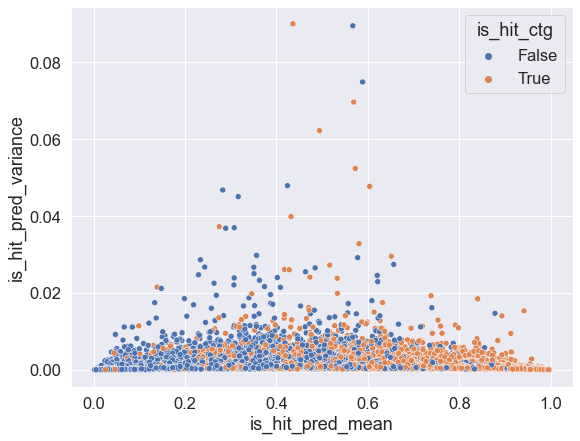

In [171]:
#plt.scatter(ens_preds_df['ls'],ens_preds_df['prediction_avg'])
plt.figure(figsize = (9,7))
ax = sns.scatterplot(data=ens_preds_df, x="is_hit_pred_mean", y="is_hit_pred_variance", hue="is_hit_ctg")
plt.show()

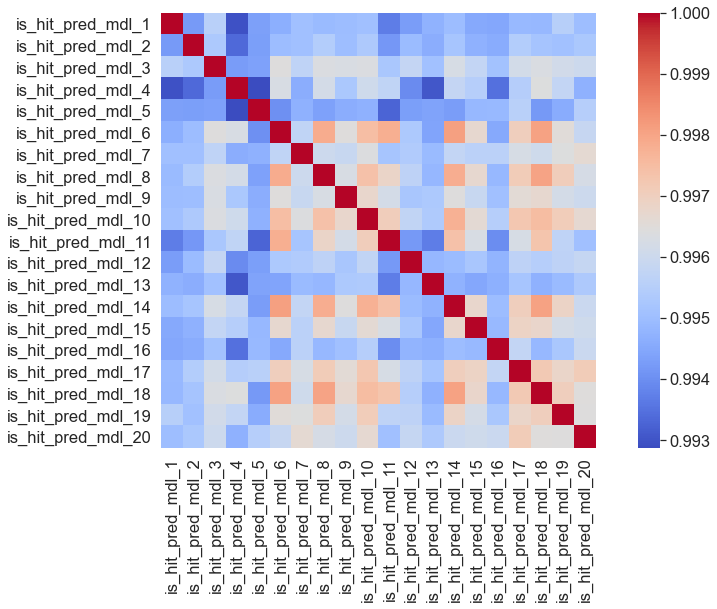

In [168]:
corr = ens_preds_df.filter(regex=("is_hit_pred_mdl_.*")).corr()
plt.figure(figsize = (15,8))
ax = sns.heatmap(corr, 
            xticklabels=1,
            yticklabels=1,
            cmap = "coolwarm",
            square = True)
#ax.set_figsize(15,15)
#plt.rcParams['figure.figsize']=(15,15)
plt.show()

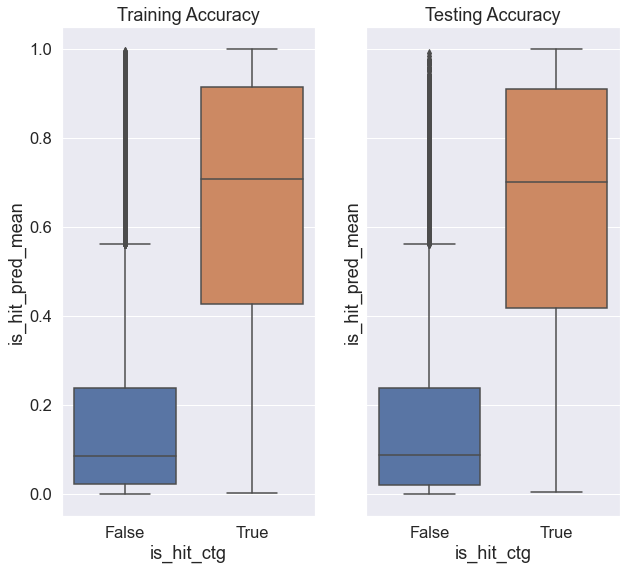

In [173]:
fig, axes = plt.subplots(1,2,figsize=(10,9),sharey = True)

sns.boxplot(ax=axes[0],x='is_hit_ctg', y='is_hit_pred_mean', data=ens_preds_df[ens_preds_df['dataset']=='Train'])
axes[0].set_title("Training Accuracy")

sns.boxplot(ax=axes[1],x='is_hit_ctg', y='is_hit_pred_mean', data=ens_preds_df[ens_preds_df['dataset']=='Test'])
axes[1].set_title("Testing Accuracy")

plt.show()

In [176]:
test_vec_in = pd.DataFrame([[115,10,0]], columns = input_vars_num)
test_vec_preds = infer_and_summarize(ens_model_list, test_vec_in)
test_vec_preds = test_vec_preds.transpose()
test_vec_preds

KeyError: "None of [Index(['launch_speed_normed', 'launch_angle_normed', 'spray_angle_normed'], dtype='object')] are in the [columns]"

In [198]:
from sklearn.utils.extmath import cartesian as cart

In [235]:
ls_lims = (20, 130)
la_lims = (-90, 90)
sa_lims = (-60, 60)

ls_grid = np.arange(start=ls_lims[0],stop=ls_lims[1]+1e-2,step=1)
la_grid = np.arange(start=la_lims[0],stop=la_lims[1]+1e-2,step=1)
sa_grid = np.arange(start=sa_lims[0],stop=sa_lims[1]+1e-2,step=1)

In [54]:
torch.cuda.empty_cache()
print(torch.cuda.memory_allocated())

2462720


In [216]:
full_gridspace_df = pd.DataFrame(cart((ls_grid,la_grid,sa_grid)), columns = input_vars_num)
#print(full_gridspace)
full_gs_preds_df = infer_and_summarize(model_list=ens_model_list, x=full_gridspace_df, basic=True)

In [217]:
full_gs_preds_df

,launch_speed,launch_angle,spray_angle,is_hit_pred_mean,is_hit_pred_median
0,20.0,-90.0,-60.0,0.495572,0.477454
1,20.0,-90.0,-59.0,0.503372,0.483141
2,20.0,-90.0,-58.0,0.510143,0.487612
3,20.0,-90.0,-57.0,0.516098,0.491310
4,20.0,-90.0,-56.0,0.521465,0.494687
...,...,...,...,...,...
2431006,130.0,90.0,56.0,0.210835,0.074943
2431007,130.0,90.0,57.0,0.211801,0.077512
2431008,130.0,90.0,58.0,0.212571,0.083535
2431009,130.0,90.0,59.0,0.213219,0.084792


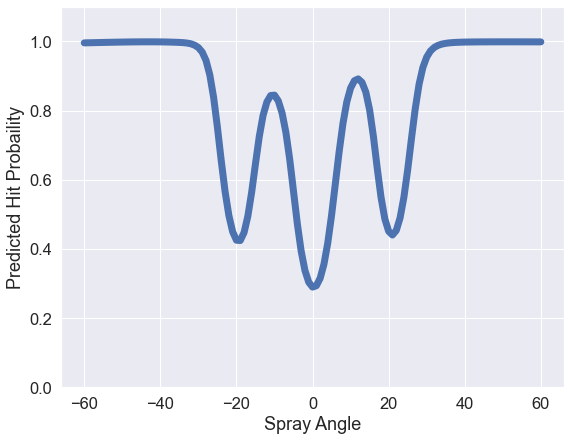

In [219]:
#make line multicolored with https://matplotlib.org/stable/gallery/lines_bars_and_markers/multicolored_line.html

set_ls = 110
set_la = 15

match_df_rows = full_gs_preds_df.loc[(full_gs_preds_df['launch_angle']==set_la) & (full_gs_preds_df['launch_speed']==set_ls)]
#print(match_df_rows)
match_df_rows.plot(x = 'spray_angle'
                   ,xlabel = 'Spray Angle'
                   , y = 'is_hit_pred_mean'
                   , ylim=(0,1.1)
                   , ylabel = 'Predicted Hit Probaility'
                   , legend = None
                   , figsize=(9,7)
                   , lw=7
                   #, cmap=plt.get_cmap('inferno')
                   )
plt.show()
#full_gs_preds_df[match_df_rows]


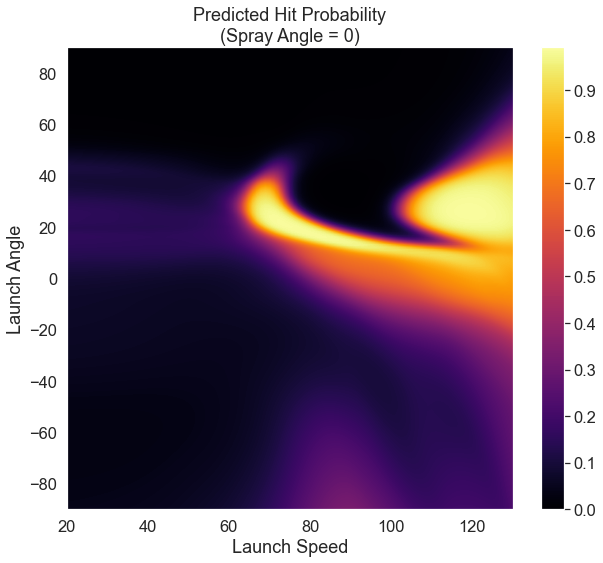

In [220]:
set_sa = 0

#sub_gs_preds = np.array(full_gs_preds_df['is_hit_pred_median'][full_gs_preds_df['spray_angle']==set_sa])
sub_gs_preds = np.array(full_gs_preds_df['is_hit_pred_mean'][full_gs_preds_df['spray_angle']==set_sa])
sub_gs_preds = sub_gs_preds.reshape(len(ls_grid),len(la_grid)).transpose()

X, Y = np.meshgrid(ls_grid, la_grid)
fig, ax = plt.subplots(figsize=(10,8.5))
cp = ax.contourf(X, Y, sub_gs_preds, levels=500, vmin=0, vmax=1, cmap=plt.get_cmap('inferno'))
ax.set_title(f'Predicted Hit Probability\n(Spray Angle = {set_sa})')
ax.set_xlabel('Launch Speed')
ax.set_ylabel('Launch Angle')
fig.colorbar(cp)
plt.show()

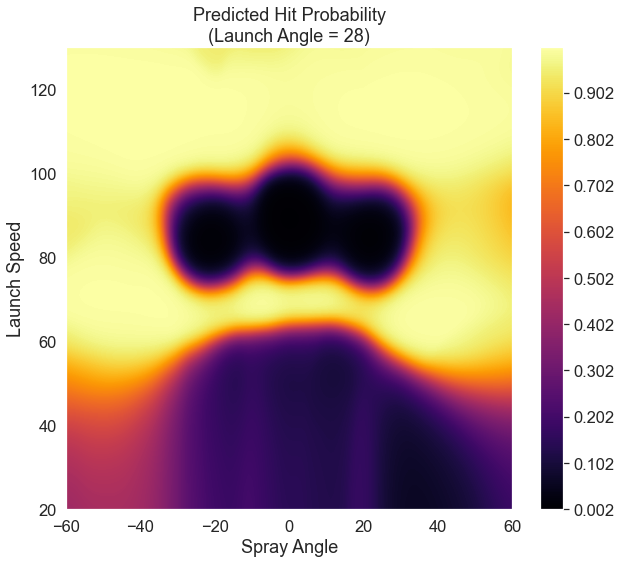

In [221]:
set_la = 28

sub_gs_preds = np.array(full_gs_preds_df['is_hit_pred_mean'][full_gs_preds_df['launch_angle']==set_la])
sub_gs_preds = sub_gs_preds.reshape(len(ls_grid),len(sa_grid))

X, Y = np.meshgrid(sa_grid, ls_grid)
fig, ax = plt.subplots(figsize=(10,8.5))
cp = ax.contourf(X, Y, sub_gs_preds, levels=500, vmin=0, vmax=1, cmap=plt.get_cmap('inferno'))
ax.set_title(f'Predicted Hit Probability\n(Launch Angle = {set_la})')
ax.set_ylabel('Launch Speed')
ax.set_xlabel('Spray Angle')
fig.colorbar(cp)
plt.show()

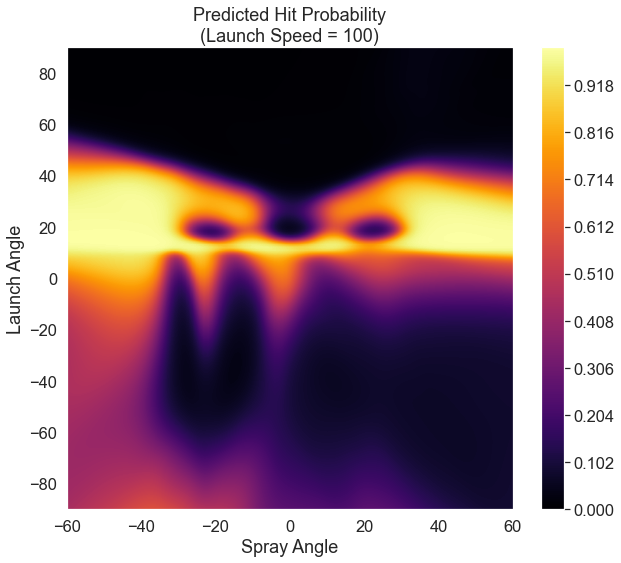

In [222]:
set_ls = 100

sub_gs_preds = np.array(full_gs_preds_df['is_hit_pred_mean'][full_gs_preds_df['launch_speed']==set_ls])
sub_gs_preds = sub_gs_preds.reshape(len(la_grid),len(sa_grid))

X, Y = np.meshgrid(sa_grid, la_grid)
fig, ax = plt.subplots(figsize=(10,8.5))
cp = ax.contourf(X, Y, sub_gs_preds, levels=500, vmin=0, vmax=1, cmap=plt.get_cmap('inferno'))
ax.set_title(f'Predicted Hit Probability\n(Launch Speed = {set_ls})')
ax.set_ylabel('Launch Angle')
ax.set_xlabel('Spray Angle')
fig.colorbar(cp)
plt.show()

In [207]:
from fastkde import fastKDE

In [227]:
kde_input_data = input_data.dropna().copy()

pdf, values = fastKDE.pdf(kde_input_data["launch_speed"], kde_input_data["launch_angle"])
v1,v2 = values

C:\Anaconda\lib\site-packages\fastkde\fastKDE.py:982: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

C:\Anaconda\lib\site-packages\fastkde\fastKDE.py:988: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



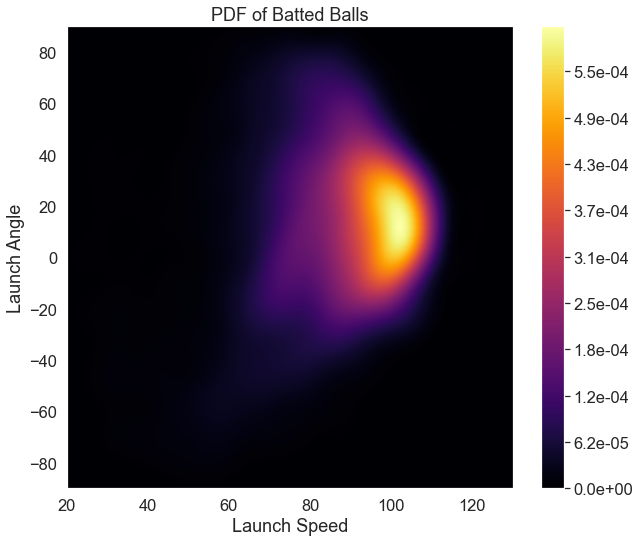

In [242]:
fig, ax = plt.subplots(figsize=(10,8.5))
cp = ax.contourf(v1,v2,pdf,levels=500, cmap=plt.get_cmap('inferno'))
ax.set_title(f'PDF of Batted Balls')
ax.set_xlabel('Launch Speed')
ax.set_xlim(ls_lims)
ax.set_ylabel('Launch Angle')
ax.set_ylim(la_lims)
fig.colorbar(cp, format = '%.1e')
plt.show()

In [244]:
#kde_input_data = input_data.dropna().copy()
pdf, values = fastKDE.pdf(kde_input_data.to_numpy(), kde_input_data.to_numpy())
#v1, v2, v3 = values

# plt.contourf(v1,v2,pdf)
# plt.show()

ValueError: var1 should be a vector.  If multiple variables are combined in a single array, please use the fastKDE class interface instead.

In [226]:
pdf.shape

(257, 129, 257)

**Want to add:**
- Improve tracking and traceability
    - Ability to save and access the model parameters & hyperparameters at specific checkpoints from the training process
    - Create ability to load from any checkpoint easily
    - Log model status at a per-iteration level
    - Display loss, param values, etc on a dashboard
    - Create visual display of nn model architecture
    - use named_parameters() instead of parameters() for printing out model architecture
- Ensembling methods
    - Approaches:
        - Mean from n models w/ same architecture
        - Mean from n models w/ different architecture
        - Weighted mean from n models, with learned weights targeting minimum classification error
    - Needs a way to properly store lists of models
- More flexible implementation of training & evaluation
    - Add ability to specify whether fully reconstructing the model, or whether it's being retrained
    - Add more arguments to a train_and_eval function to control stopping criteria, number of epochs, what to output/return, etc
    - Implement single iteration step as a separately-called function, which is looped in main training function
    - Add model setup function that can set up all the parameters for the run
    - Create model predict function that at minimum, requires a model and an input tensor, and gives back a predicted output tensor. Or specify two tensors (input and validation) and get back the outputs for each.
    - Create model evaluation function that takes a loss function, a predicted output tensor, and an actual output tensor, and gives back the total loss. Allows for two sets of tensors as well.
    - Add early stopping logic, settable from function call
    - Consider creating a full class for the model trainer
- Add cross-validation to model training
- Optuna framework for creating training sub-cycles
    - e.g. First, perturb weights by taking w = w*Norm(1,0.1), then train model for 100 steps with AdamW using p params, then repeat, etc
- Using fastDKE, either print contour lines or apply mask to result plots to help indicate where hits are the most common
- Implement some way to restrict the number of trainable parameters and/or neuron count when constructing models
- Change usage of calls to time
    - Implement time.sleep() within multiple init step
    - Make time.perf_counter() work at a per-iteration basis, summing all into the total training time
- Round off numbers in printed results

In [ ]:
#as a method of data augmentation, can generate pdf(hit stats|is_hit=0), pdf(hit stats|is_hit=1), pdf(hit_stats)
#then, calculate probablity of hit at each grid point using p_is_hit(grid) = pdf(hs|ih=1)/(pdf(hs|ih=0) + pdf(hs|ih=1))
#predict nn with p_is_hit as target, and pdf(hit_stats) as the sample weights
#theoretically, this provides us a way to smooth and/or augment the dataset

